### This notebook compares two ripple detection methods.
#### Goals:
##### 1. Will one method give you many more events and longer events compared to the other?

May 2 - May 7, 2024
Shijie Gu

In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import spikeinterface as si
import pynwb
import xarray as xr

from spyglass.common.common_interval import _intersection
from spyglass.common import (IntervalPositionInfo, IntervalPositionInfoSelection, IntervalList, 
                             ElectrodeGroup, LFP, BrainRegion, LFPBand, Electrode)
from ripple_detection.core import (gaussian_smooth,
                                   get_envelope,
                                   get_multiunit_population_firing_rate,
                                   threshold_by_zscore,
                                   segment_boolean_series,
                                   exclude_close_events,
                                   exclude_movement,
                                   extend_threshold_to_mean,
                                    merge_overlapping_ranges)
from ripple_detection.detectors import multiunit_HSE_detector,_get_event_stats
from spyglass.utils.nwb_helper_fn import get_nwb_copy_filename

from spyglass.spikesorting.v0 import (SortGroup, 
                                    SortInterval,
                                    SpikeSortingPreprocessingParameters,
                                    SpikeSortingRecording, 
                                    SpikeSorterParameters,
                                    SpikeSortingRecordingSelection,
                                    ArtifactDetectionParameters, ArtifactDetectionSelection,
                                    ArtifactRemovedIntervalList, ArtifactDetection,
                                      SpikeSortingSelection, SpikeSorting,)

from spyglass.shijiegu.Analysis_SGU import TrialChoice,RippleTimes
from spyglass.shijiegu.helpers import interval_union,interpolate_to_new_time
from spyglass.shijiegu.load import load_LFP
from spyglass.shijiegu.ripple_detection import (loadRippleLFP,get_Kay_ripple_consensus_trace,plot_ripple,threshold_by_zscore_Gu,Gu_ripple_detector,)
from spyglass.common.common_position import IntervalLinearizedPosition

[2024-05-13 17:27:34,556][INFO]: Connecting shijiegu-alt@lmf-db.cin.ucsf.edu:3306
[2024-05-13 17:27:34,593][INFO]: Connected shijiegu-alt@lmf-db.cin.ucsf.edu:3306


In [3]:
from spyglass.shijiegu.ripple_detection import (loadRippleLFP,
                                                get_Kay_ripple_consensus_trace,
                                                plot_ripple,threshold_by_zscore_Gu,
                                                Kay_ripple_detector,Karlsson_ripple_detector,Gu_ripple_detector,
                                                removeDataBeforeTrial1,
                                                loadRippleLFP_OneChannelPerElectrode)

In [4]:
def getRippleEnvelope(nwb_file_name,interval_list_name,pos_interval_list_name):
    """
    returns:
    filtered_lfps: (session length) x (number of channels)
    CA1TetrodeInd: column index of filtered_lfps that correspond to a CA1 tetrode. One for each electrode.
    CCTetrodeInd: column index of filtered_lfps that correspond to a reference tetrodes.
    """
    nwb_copy_file_name = get_nwb_copy_filename(nwb_file_name)

    position_valid_times = (IntervalList & {'nwb_file_name': nwb_copy_file_name,
                                        'interval_list_name': pos_interval_list_name}).fetch1('valid_times')

    # Broad-band LFP
    
    # Ripple-band LFP
    ripple_data, ripple_timestamps, electrodes = loadRippleLFP(nwb_copy_file_name,interval_list_name,
                                                         position_valid_times,
                                                         'filtered data');
    electrodes.index = np.arange(len(electrodes))

    # find tetrodes with signal
    groups_with_cell=(SpikeSortingRecordingSelection & {
        'nwb_file_name' : nwb_copy_file_name}).fetch('sort_group_id')
    groups_with_cell
    groups_with_cell=np.setdiff1d(groups_with_cell,[100,101])

    ## get index for each electrode with cell, only choose one channel
    CA1TetrodeInd = []
    for e in groups_with_cell:
        CA1TetrodeInd.append(electrodes[electrodes['group_name']==str(e)].index[0])
    
    ## get reference electrode index
    CCTetrodeInd = []
    LFPTetID = np.array([int(a) for a in np.unique(electrodes.group_name)])
    CA1TetrodeReferenceTetID = np.setdiff1d(LFPTetID,groups_with_cell)
    
    for e in np.unique(np.array(CA1TetrodeReferenceTetID)):
        CCTetrodeInd.append(electrodes[electrodes['group_name']==str(e)].index[0])

    ### get envelope
    not_null = np.all(pd.notnull(ripple_data), axis=1)
    
    filtered_lfps, time = (
            ripple_data[not_null], ripple_timestamps[not_null])
    
    filtered_lfps_env = get_envelope(filtered_lfps)

    return filtered_lfps, filtered_lfps_env, ripple_timestamps, CA1TetrodeInd, CCTetrodeInd

In [5]:
def loadPosition(nwb_file_name,pos_interval_list_name,lfps_t):
    """lfps_t is the timestamp to upsample to"""
    nwb_copy_file_name = get_nwb_copy_filename(nwb_file_name)
    
    position_info_param_name = 'default'
    position_valid_times = (IntervalList & {'nwb_file_name': nwb_copy_file_name,
                                            'interval_list_name': pos_interval_list_name}).fetch1('valid_times')
    
    position_info = (IntervalPositionInfo() & {'nwb_file_name': nwb_copy_file_name,
                     'interval_list_name': pos_interval_list_name,
                     'position_info_param_name': position_info_param_name}).fetch1_dataframe()
    
    position_info = pd.concat(
        [position_info.loc[slice(valid_time[0], valid_time[1])]
         for valid_time in position_valid_times], axis=0)

    position_info_upsample = interpolate_to_new_time(position_info, lfps_t)

    return position_info_upsample

In [6]:
filtered_lfps = {}
filtered_lfps_t = {}
CA1TetrodeInd = {}
CCTetrodeInd = {}
position_info = {}
StateScript = {}

nwb_file_name = 'eliot20221025.nwb'
pos_interval_list_name = 'pos 1 valid times'
interval_list_name='02_Seq2Session1'

nwb_copy_file_name = get_nwb_copy_filename(nwb_file_name)
filtered_lfps['eliot'], _, filtered_lfps_t['eliot'], CA1TetrodeInd['eliot'], CCTetrodeInd['eliot'] = getRippleEnvelope(
    nwb_file_name,interval_list_name,pos_interval_list_name)
position_info['eliot'] = loadPosition(nwb_file_name,pos_interval_list_name,filtered_lfps_t['eliot'])
StateScript['eliot'] = pd.DataFrame((TrialChoice & {'nwb_file_name':nwb_copy_file_name,
                                                    'epoch':interval_list_name[:2]}).fetch1('choice_reward'))

nwb_file_name = 'molly20220416.nwb'
pos_interval_list_name = 'pos 1 valid times'
interval_list_name='02_Seq2Session1'

nwb_copy_file_name = get_nwb_copy_filename(nwb_file_name)
filtered_lfps['molly'], _, filtered_lfps_t['molly'], CA1TetrodeInd['molly'], CCTetrodeInd['molly'] = getRippleEnvelope(
    nwb_file_name,interval_list_name,pos_interval_list_name)
position_info['molly'] = loadPosition(nwb_file_name,pos_interval_list_name,filtered_lfps_t['molly'])
StateScript['molly'] = pd.DataFrame((TrialChoice & {'nwb_file_name':nwb_copy_file_name,
                                                    'epoch':interval_list_name[:2]}).fetch1('choice_reward'))


In [7]:
def removeDataBeforeTrial1(position_df,trial_1_time,trial_last_time):
    problem_ind = position_df.index[np.logical_or(position_df.index <= trial_1_time,
                                                  position_df.index >= trial_last_time)]
    position_df.loc[problem_ind] = np.nan
    return position_df

In [8]:
for a in ['molly','eliot']:
    trial_1_t = StateScript[a].loc[1].timestamp_O
    trial_last_t = StateScript[a].loc[len(StateScript[a])-1].timestamp_O
    position_info[a] = removeDataBeforeTrial1(position_info[a],trial_1_t,trial_last_t)

In [9]:
lfps = {}
lfps_t = {}

nwb_file_name = 'eliot20221025.nwb'
pos_interval_list_name = 'pos 1 valid times'
interval_list_name='02_Seq2Session1'

nwb_copy_file_name = get_nwb_copy_filename(nwb_file_name)
lfps['eliot'],lfps_t['eliot'] = load_LFP(nwb_copy_file_name,interval_list_name)

nwb_file_name = 'molly20220416.nwb'
pos_interval_list_name = 'pos 1 valid times'
interval_list_name='02_Seq2Session1'

nwb_copy_file_name = get_nwb_copy_filename(nwb_file_name)
lfps['molly'],lfps_t['molly'] = load_LFP(nwb_copy_file_name,interval_list_name)

[2024-05-13 17:28:05,958][WARNING]: Skipped checksum for file with hash: 08172ac2-484a-d283-c8cb-d7897f4927c0, and path: /stelmo/nwb/analysis/eliot20221025/eliot20221025_4490LUWCRA.nwb
[2024-05-13 17:28:06,246][WARNING]: Skipped checksum for file with hash: c27ed111-5874-6f10-e524-d8cc1d07f990, and path: /stelmo/nwb/analysis/molly20220416_1477YXCRGD.nwb


### Consensus method

In [10]:
lfp_band_sampling_rate=(LFPBand & {'nwb_file_name': 'molly20220416_.nwb',
                             'target_interval_list_name': interval_list_name,
                             'filter_name': 'Ripple 150-250 Hz'}).fetch1('lfp_band_sampling_rate')

In [11]:
lfp_band_sampling_rate

1000

In [12]:
RippleTimes = {}
for animal in ['molly','eliot']:
    RippleTimes[animal] = Kay_ripple_detector(
        filtered_lfps_t[animal], filtered_lfps[animal],
        np.array(position_info[animal].head_speed), lfp_band_sampling_rate, zscore_threshold=2.0)

The shape of LFP input is (626225, 114)
The shape of LFP input is (1955601, 62)


In [13]:
RippleTimes['eliot']

,start_time,end_time,duration,mean_zscore,median_zscore,max_zscore,min_zscore,speed_at_start,speed_at_end,max_speed,min_speed,median_speed,mean_speed
event_number,,,,,,,,,,,,,
1,1.666725e+09,1.666725e+09,0.214,1.242891,1.180714,2.394906,0.084577,0.232252,0.235446,0.380473,0.045757,0.268169,0.249774
2,1.666725e+09,1.666725e+09,0.027,3.365488,3.198985,4.492662,1.946019,3.998692,3.995207,3.998692,3.858743,3.930049,3.928951
3,1.666725e+09,1.666725e+09,0.030,2.025021,2.612021,2.895945,0.058925,3.995953,3.616925,3.995953,3.583548,3.775022,3.777825
4,1.666725e+09,1.666725e+09,0.208,1.161301,0.920622,5.135447,0.014029,3.987586,0.898562,3.987586,0.898562,1.942163,2.140329
5,1.666725e+09,1.666725e+09,0.058,1.534561,1.396292,3.898864,0.059195,0.439297,0.357753,0.439297,0.357753,0.403201,0.401067
...,...,...,...,...,...,...,...,...,...,...,...,...,...
234,1.666727e+09,1.666727e+09,0.082,1.386192,1.238379,3.268633,0.003658,0.981921,0.981920,0.981921,0.981920,0.981921,0.981921
235,1.666727e+09,1.666727e+09,0.320,1.584073,1.190473,9.993297,0.020652,0.981992,3.980154,3.980154,0.981992,1.030327,1.404123
236,1.666727e+09,1.666727e+09,0.097,1.854034,1.849341,3.593127,0.049214,3.971823,0.920192,3.971823,0.920192,1.812689,2.038945


In [18]:
RippleTimes['eliot'].loc[1].start_time

1666724797.027715

In [14]:
for animal in ['molly','eliot']:
    print(len(RippleTimes[animal]))

141
238


In [25]:
animal = 'eliot'
test = Kay_ripple_detector(filtered_lfps_t[animal], filtered_lfps[animal],np.array(position_info[animal].head_speed), lfp_band_sampling_rate, zscore_threshold=2.0)

The shape of LFP input is (1955601, 62)


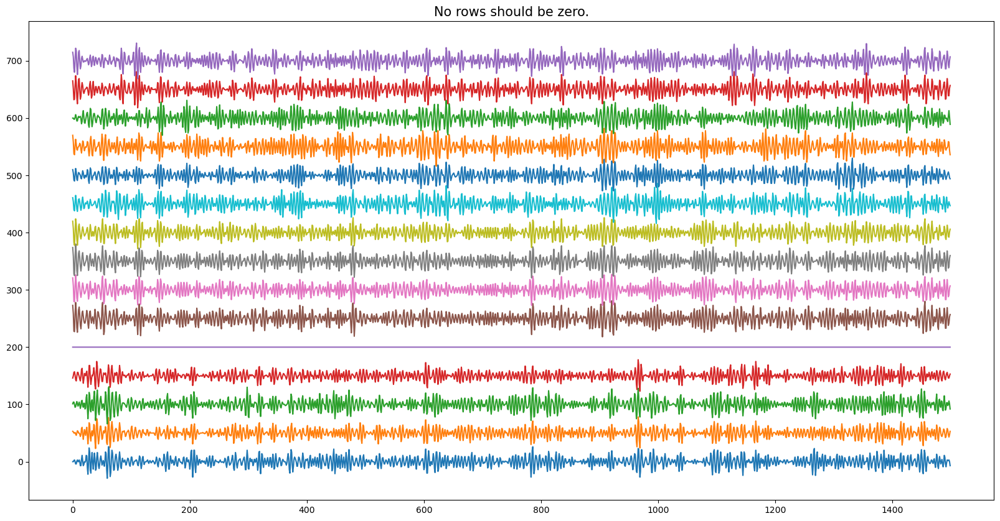

In [29]:
plt.subplots(ncols=1,nrows=1,figsize=(20,10))
base = 107000
r_ind = 0
for i in range(15):
    plt.plot(filtered_lfps[animal][base:base+1500,i]+r_ind*50);
    r_ind += 1;
plt.title('No rows should be zero.',size = 15);

### Individual tetrode method

In [232]:
from spyglass.shijiegu.ripple_detection import Karlsson_ripple_detector

In [249]:
RippleTimes_Karlsson = {}
for animal in ['molly','eliot']:
    print(animal)
    RippleTimes_Karlsson[animal] = Karlsson_ripple_detector(
        filtered_lfps_t[animal], filtered_lfps[animal][:,CA1TetrodeInd[animal]],
        np.array(position_info[animal].head_speed), lfp_band_sampling_rate, zscore_threshold=2.0)

molly
eliot


In [328]:
RippleTimes_Karlsson[animal]

,start_time,end_time,duration,mean_zscore,median_zscore,max_zscore,min_zscore,speed_at_start,speed_at_end,max_speed,min_speed,median_speed,mean_speed
event_number,,,,,,,,,,,,,
1,1.666283e+09,1.666283e+09,0.095,0.628220,0.511443,1.580232,-0.504714,0.487597,0.936815,0.936815,0.411884,0.556786,0.601826
2,1.666283e+09,1.666283e+09,0.066,0.319296,0.366693,1.150050,-0.347220,0.662084,0.424625,0.662084,0.424625,0.518557,0.530102
3,1.666283e+09,1.666283e+09,0.051,0.639908,0.649661,1.266391,-0.114904,0.803077,0.833286,0.833286,0.803077,0.820894,0.820585
4,1.666283e+09,1.666283e+09,0.062,0.344941,0.381345,0.841930,-0.097518,3.312429,3.103186,3.328918,3.103186,3.312979,3.265876
5,1.666283e+09,1.666283e+09,0.127,0.506981,0.492311,1.210932,-0.121917,3.149075,1.632877,3.149075,1.355113,1.967367,2.089922
...,...,...,...,...,...,...,...,...,...,...,...,...,...
422,1.666285e+09,1.666285e+09,0.088,0.645695,0.411954,2.070110,-0.212661,0.087454,0.087454,0.087454,0.087454,0.087454,0.087454
423,1.666285e+09,1.666285e+09,0.170,2.966815,1.444798,13.338850,-0.499524,0.087454,0.087454,0.087454,0.087454,0.087454,0.087454
424,1.666285e+09,1.666285e+09,0.095,0.589572,0.556498,1.405987,0.133345,0.898669,1.189164,1.189164,0.898669,1.003589,1.015085


In [252]:
for animal in ['molly','eliot']:
    print(len(RippleTimes_Karlsson[animal]))

152
426


### The big difference between the two methods means that we need to do some plotting.

In [254]:
def removeLongRipples(ripple_times):
    """ripple_times from Karlsson_ripple_detector or Kay_ripple_detector"""
    ## find those ripples with time longer than 2s
    ripple_times['duration'] = ripple_times['end_time'] - ripple_times['start_time']
    ripple_times_processed = ripple_times.loc[ripple_times['duration'] < 2]

    return ripple_times_processed

In [255]:
RippleTimes_processed = {}
RippleTimes_Karlsson_processed = {}
for animal in ['molly','eliot']:
    RippleTimes_Karlsson_processed[animal] = removeLongRipples(RippleTimes_Karlsson[animal])
    RippleTimes_processed[animal] = removeLongRipples(RippleTimes[animal])

In [424]:
for animal in ['molly','eliot']:
    print(animal+ ': The number of events found by Consensus is '+ str(len(RippleTimes[animal])))
    print(animal+ ': The number of events found by Karlsson is '+ str(len(RippleTimes_Karlsson[animal])))

molly: The number of events found by Consensus is 141
molly: The number of events found by Karlsson is 152
eliot: The number of events found by Consensus is 205
eliot: The number of events found by Karlsson is 426


In [320]:
for animal in ['molly','eliot']:
    print(animal+ ': The number of events found by Consensus is '+ str(len(RippleTimes_processed[animal])))
    print(animal+ ': The number of events found by Karlsson is '+ str(len(RippleTimes_Karlsson_processed[animal])))

molly: The number of events found by Consensus is 141
molly: The number of events found by Karlsson is 152
eliot: The number of events found by Consensus is 205
eliot: The number of events found by Karlsson is 426


In [425]:
### So remove long "ripple" operation is not needed

In [257]:
def checkOverLap(oped1,oped2):
    if oped1[0] <= oped2[0]:
        return oped1[1] > oped2[0]
    elif oped2[0] < oped1[0]:
        return oped2[1] > oped1[0]

### 1. First, we find unique events to each method and common events

In [378]:
"""
To find unique ripples to each method
"""
animal = 'eliot'

matches = []
unique_ripple_index = np.zeros(len(RippleTimes_processed[animal])) + 1;
unique_ripple_index_K = np.zeros(len(RippleTimes_Karlsson_processed[animal])) + 1;

for i in range(len(RippleTimes_processed[animal])):
    #ripple_name = RippleTimes_processed[animal].iloc[i].name
    op_ed = [RippleTimes_processed[animal].iloc[i]['start_time'],RippleTimes_processed[animal].iloc[i]['end_time']]
    
    for j in range(len(RippleTimes_Karlsson_processed[animal])):
        #ripple_name_K = RippleTimes_Karlsson_processed[animal].iloc[j].name
        op_ed_K = [RippleTimes_Karlsson_processed[animal].iloc[j]['start_time'],
                          RippleTimes_Karlsson_processed[animal].iloc[j]['end_time']]
        if checkOverLap(op_ed,op_ed_K):
            #matches.append([ripple_name,ripple_name_K])
            matches.append([i,j])
            unique_ripple_index[i] = 0;
            unique_ripple_index_K[j] = 0;


In [379]:
animal = 'eliot'

"""
To find common ripples to each method
"""
            
matchM = np.zeros((len(RippleTimes_processed[animal]),len(RippleTimes_Karlsson_processed[animal])))
for m in matches:
    matchM[m[0],m[1]] = 1
    
groups = []
for i in range(matchM.shape[0]):
    group = []
    nonzeroCols = np.argwhere(matchM[i,:]).ravel()
    for j in nonzeroCols:
        nonzeroRows = np.argwhere(matchM[:,j]).ravel()
        for k in nonzeroRows:
            group.append((k,j))
    if len(group)>0:
        groups.append(group)       

### We use ripples that we can find 1-to-1 mappings between the two methods to compare detected ripple length.

     delta  Consensus  Karlsson
0   -0.035          1         1
1   -0.050          3         8
2   -0.010          4        10
3    0.034          5        15
4    0.178          6        19
..     ...        ...       ...
175  0.048        200       415
176  0.017        201       417
177  0.090        203       421
178 -0.007        204       422
179 -0.005        205       423

[180 rows x 3 columns]


Text(0, 0.5, 'percentage')

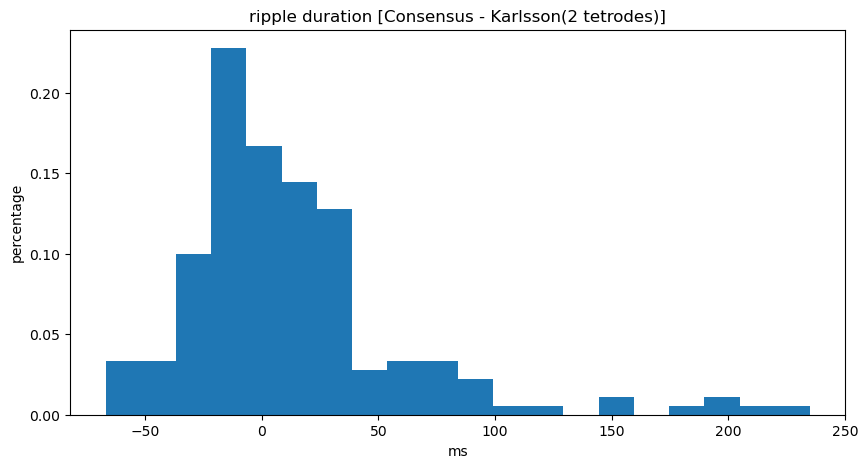

In [392]:
# looking at one-to-one matches for now
row_index = 0
entries = []
for g in groups:
    if len(g) == 1:
        rowInd1 = g[0][0]
        rowInd2 = g[0][1]
        entry = {}
        entry['delta'] = (RippleTimes_processed[animal].iloc[rowInd1].duration - 
                                              RippleTimes_Karlsson_processed[animal].iloc[rowInd2].duration)
        entry['Consensus'] = RippleTimes_processed[animal].iloc[rowInd1].name
        entry['Karlsson'] = RippleTimes_Karlsson_processed[animal].iloc[rowInd2].name
        
        entries.append(entry)
        row_index += 1;
matchTable = pd.DataFrame(entries) 

print(matchTable)
fig, ax = plt.subplots(nrows=1, ncols=1,figsize = (10,5))
plt.hist(matchTable.delta*1000,bins = 20, weights=np.ones(len(matchTable.delta)) / len(matchTable.delta));
ax.set_title('ripple duration [Consensus - Karlsson(2 tetrodes)]')
ax.set_xlabel('ms')
ax.set_ylabel('percentage')

### 2. We will extend each common ripple event to union of their timestamps

In [411]:
from itertools import chain
def ExtendInterSection(Consensus,Karlsson):

    candidate_ripple_times = []
    
    for i in range(len(Consensus)):

        op_ed = [Consensus.iloc[i]['start_time'],Consensus.iloc[i]['end_time']]
    
        for j in range(len(Karlsson)):

            op_ed_K = [Karlsson.iloc[j]['start_time'],Karlsson.iloc[j]['end_time']]
        
            if checkOverLap(op_ed,op_ed_K):

                candidate_ripple_times.append((np.min([op_ed[0],op_ed_K[0]]),np.max([op_ed[1],op_ed_K[1]])))
                
    candidate_ripple_list = list(merge_overlapping_ranges(candidate_ripple_times))

    return candidate_ripple_list 
    """

    index = pd.Index(np.arange(len(candidate_ripple_list)) + 1,name='ripple_number')
    return pd.DataFrame(candidate_ripple_list,
                        columns=['start_time', 'end_time'],
                        index=index) 
    """

In [418]:
### Get speed SD info
from scipy.stats import zscore
def get_event_stats(candidate_ripple_list,time, filtered_lfps, speed, sampling_frequency, smoothing_sigma=0.004):

    filtered_lfps = np.asarray(filtered_lfps)
    print("The shape of LFP input is " + str(filtered_lfps.shape))

    not_null = np.all(pd.notnull(filtered_lfps), axis=1)
    filtered_lfps, speed, time = (
        filtered_lfps[not_null], speed[not_null], time[not_null])

    filtered_lfps = get_envelope(filtered_lfps)
    combined_filtered_lfps = np.sum(filtered_lfps ** 2, axis=1)
    combined_filtered_lfps = gaussian_smooth(
        combined_filtered_lfps, smoothing_sigma, sampling_frequency)
    combined_filtered_lfps = np.sqrt(combined_filtered_lfps)

    combined_filtered_lfps = zscore(combined_filtered_lfps, nan_policy = 'omit')

    return _get_event_stats(candidate_ripple_list, time, combined_filtered_lfps, speed)


In [419]:
RippleTimes_InterSection = {}
for animal in ['eliot','molly']:
    candidate_ripple_list = ExtendInterSection(RippleTimes_processed[animal],RippleTimes_Karlsson_processed[animal])
    RippleTimes_InterSection[animal] = get_event_stats(np.array(candidate_ripple_list),filtered_lfps_t[animal], filtered_lfps[animal],
                                                       np.array(position_info[animal].head_speed), lfp_band_sampling_rate)

The shape of LFP input is (2272500, 66)
The shape of LFP input is (626225, 114)


In [422]:
len(RippleTimes_InterSection['eliot'])/len(RippleTimes_processed['eliot'])

0.926829268292683

In [423]:
len(RippleTimes_InterSection['molly'])/len(RippleTimes_processed['molly'])

0.7446808510638298

### 3. Visual Inspection

In [372]:
animal = 'eliot'
"""Get broad band LFP"""
lfp_df = pd.DataFrame(data=lfps[animal][:,CA1TetrodeInd[animal]], index=lfps_t[animal])
lfp_df.index.name='time'
lfp_df=xr.Dataset.from_dataframe(lfp_df)

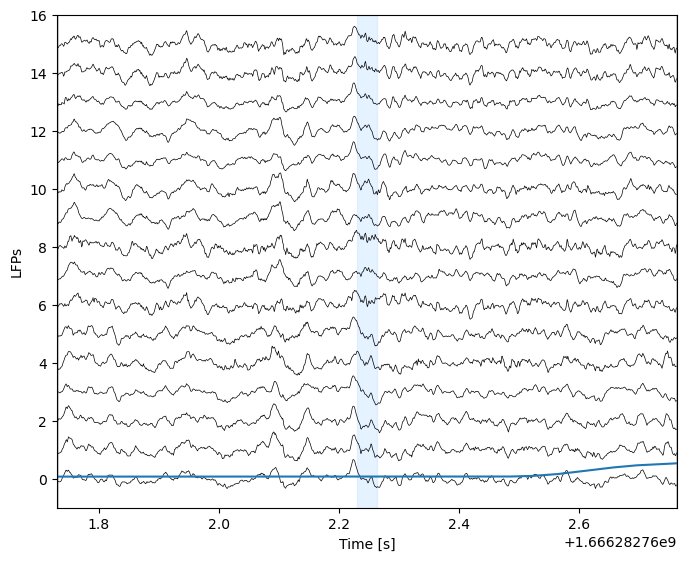

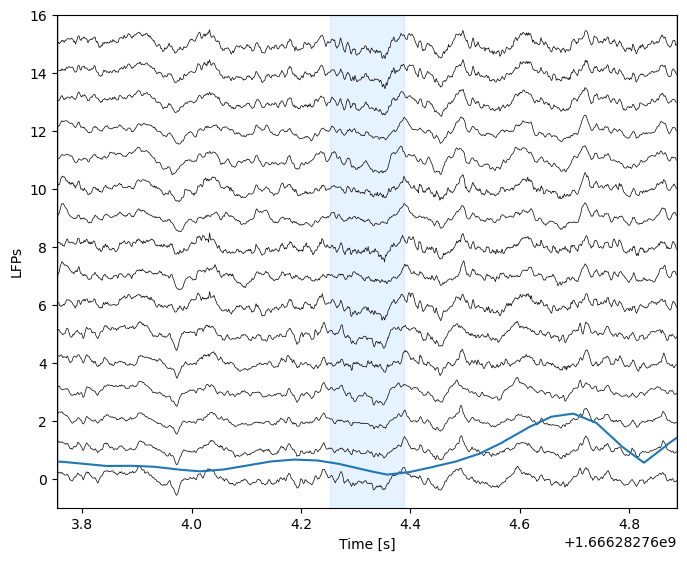

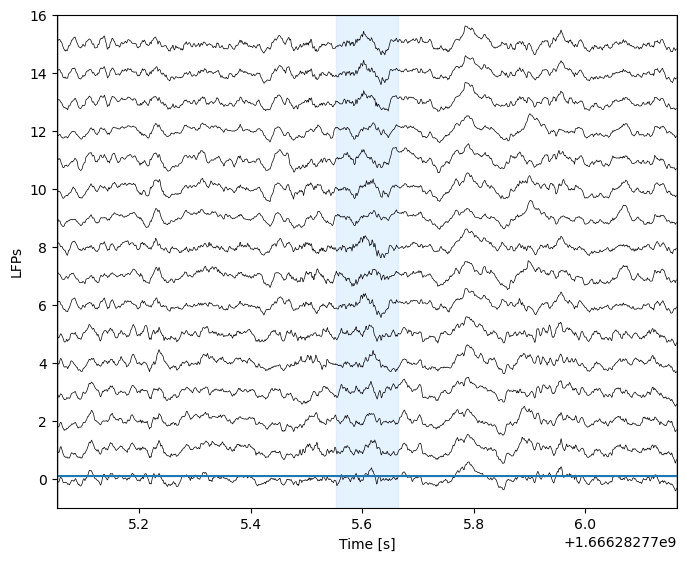

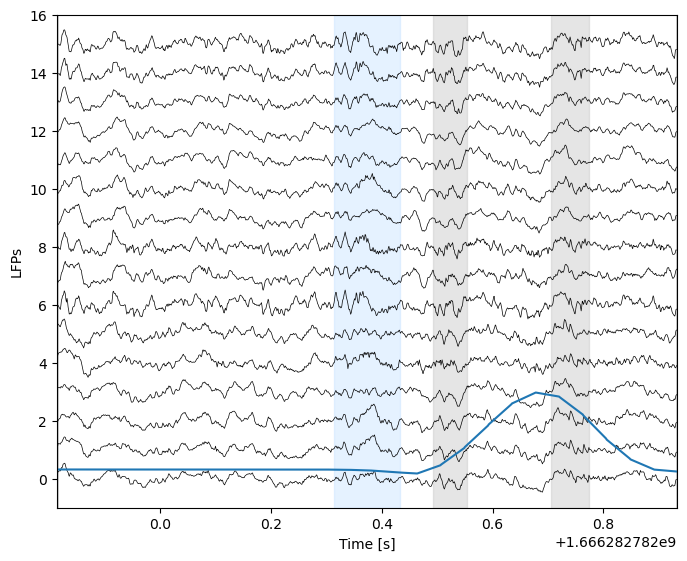

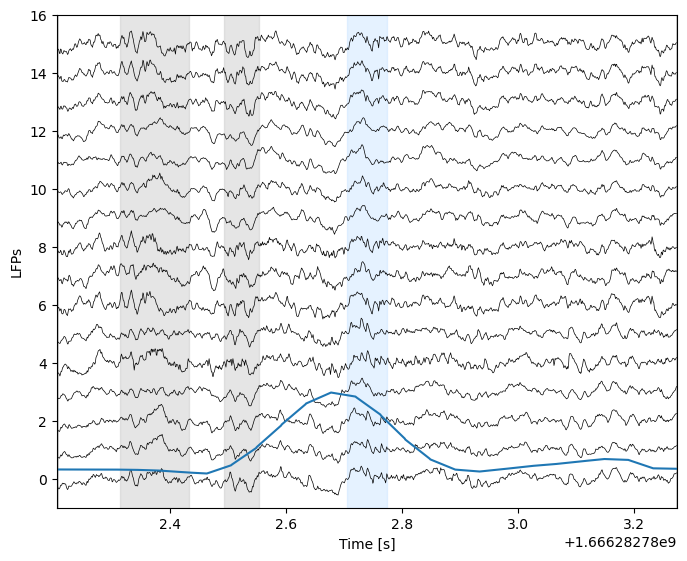

...

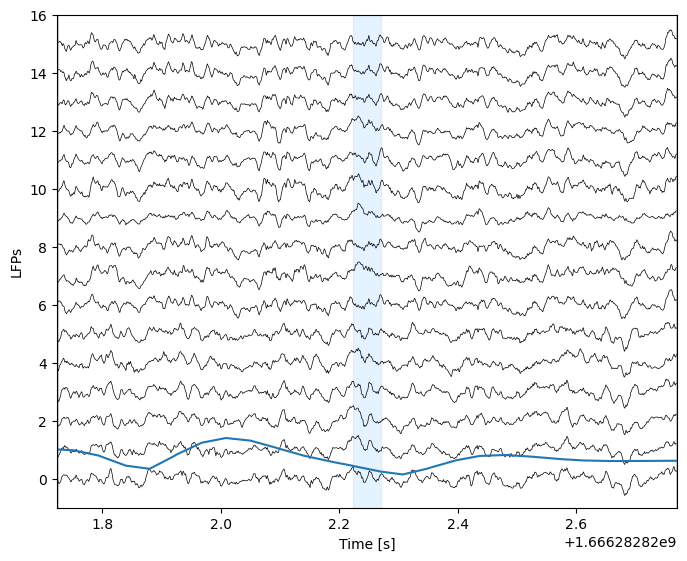

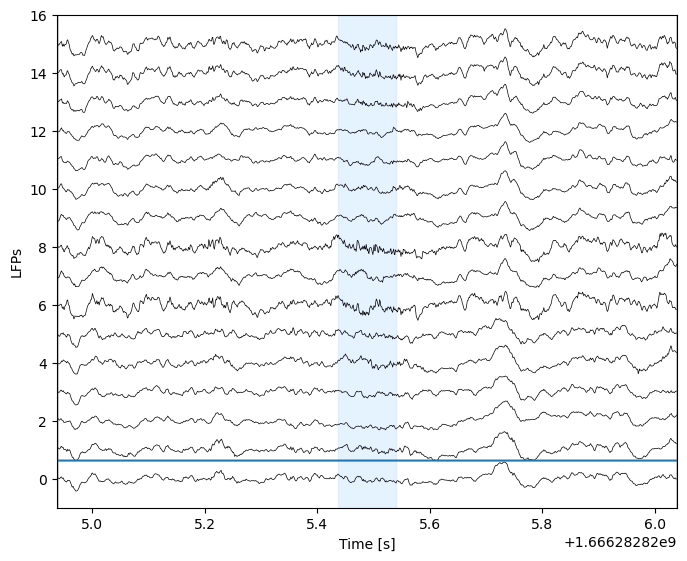

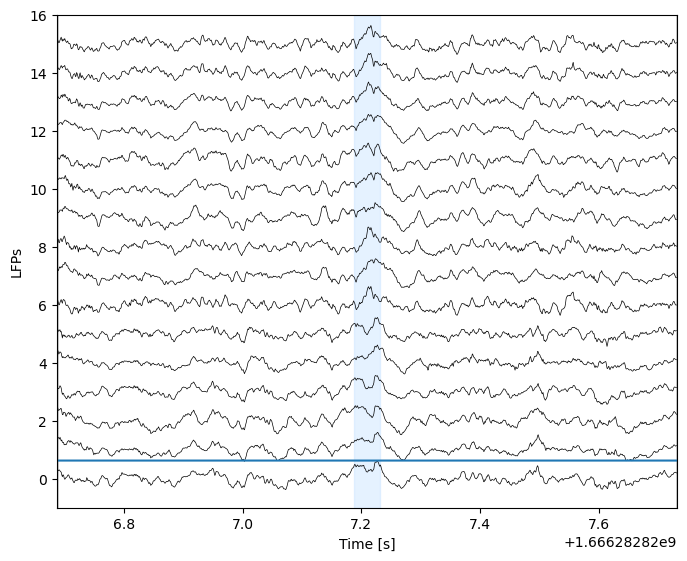

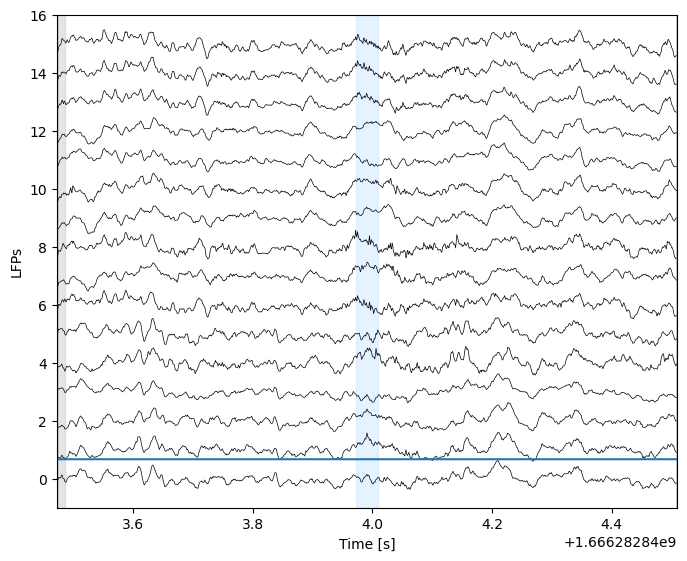

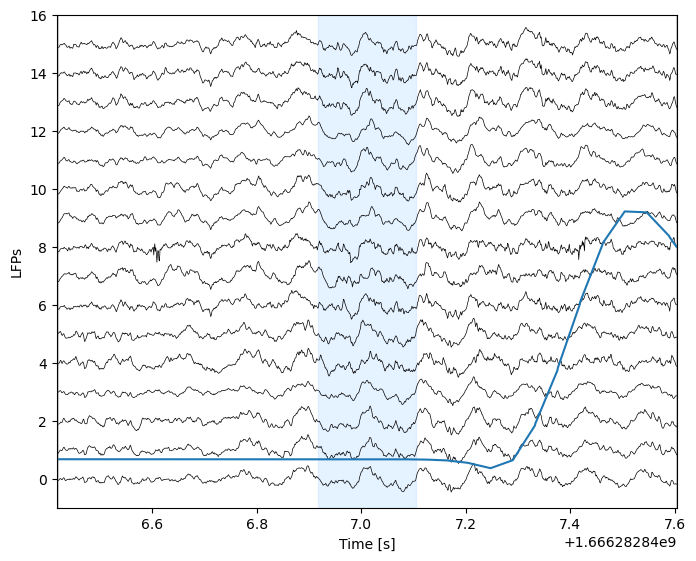

In [394]:
"""Unique ripple events found by Karlsson Method"""
for r in np.argwhere(unique_ripple_index_K).ravel()[20:40]:
    ripple_name = RippleTimes_Karlsson_processed[animal].iloc[r].name
    plot_ripple(lfp_df, RippleTimes_Karlsson_processed[animal],
                ripple_label=ripple_name,  offset=0.5, relative=False)

    # Add speed into on top
    offset = 0.5
    op = RippleTimes_Karlsson_processed[animal].loc[ripple_name].start_time - offset
    ed = RippleTimes_Karlsson_processed[animal].loc[ripple_name].end_time + offset
    ind = np.logical_and(position_info[animal].index >= op, position_info[animal].index <= ed)
    
    plt.plot(position_info[animal].head_speed[ind])

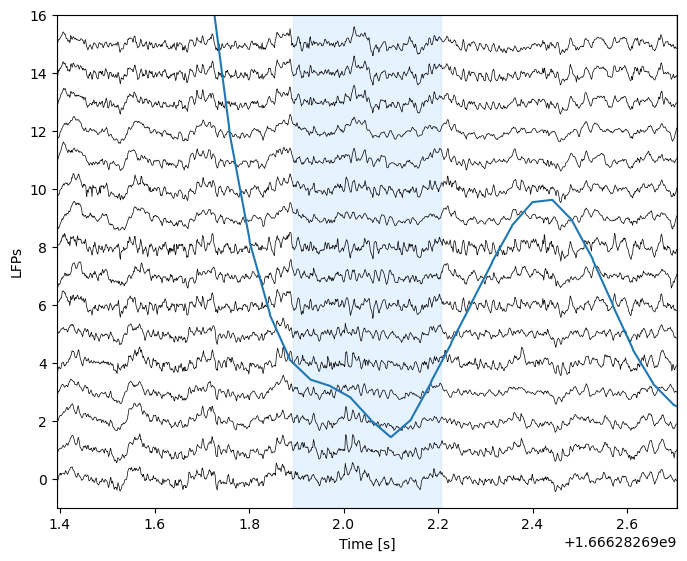

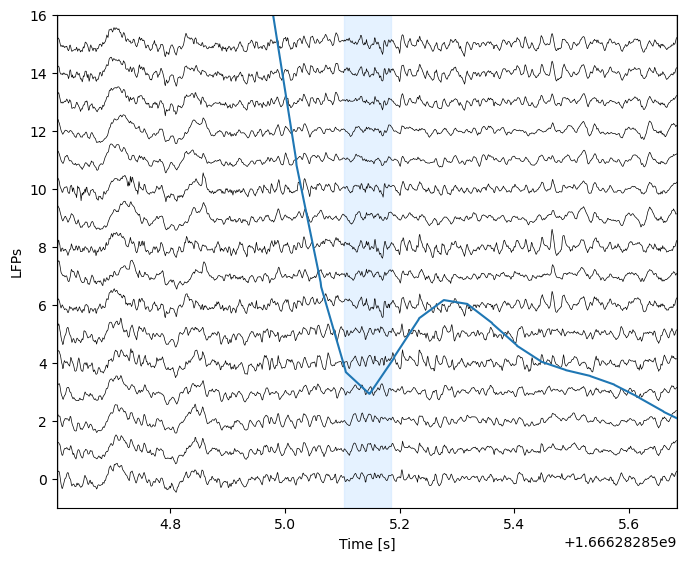

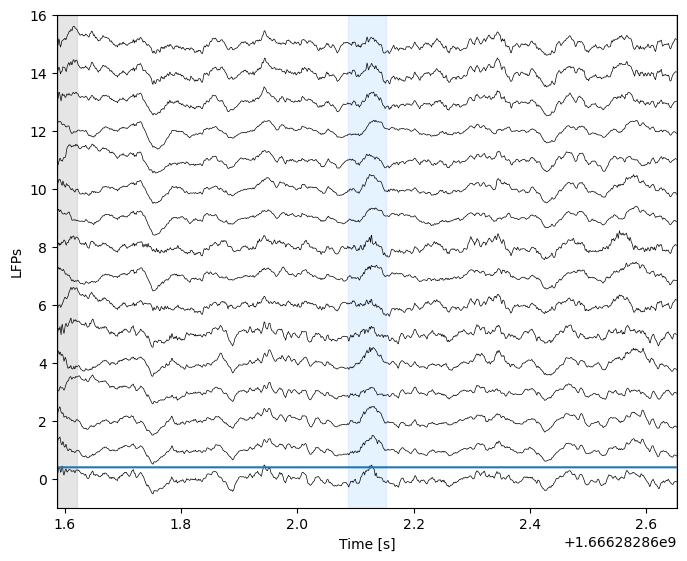

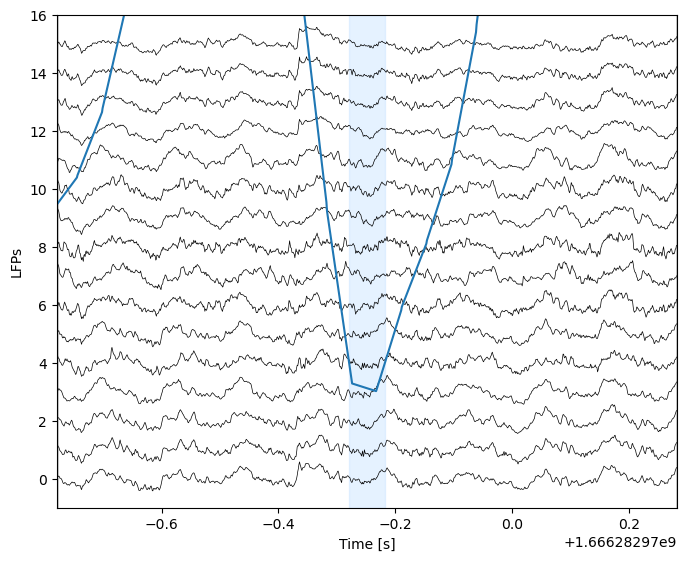

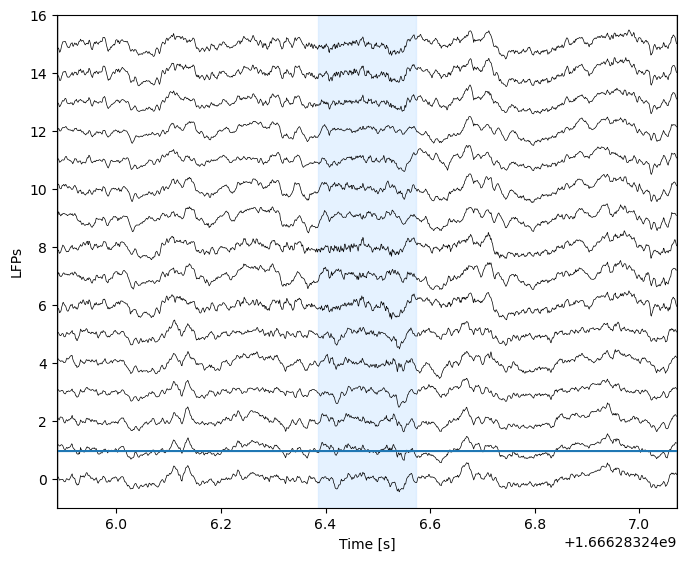

...

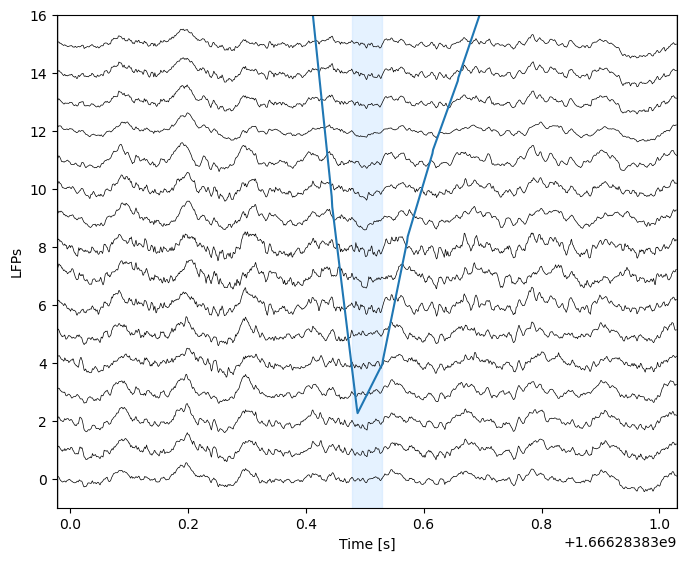

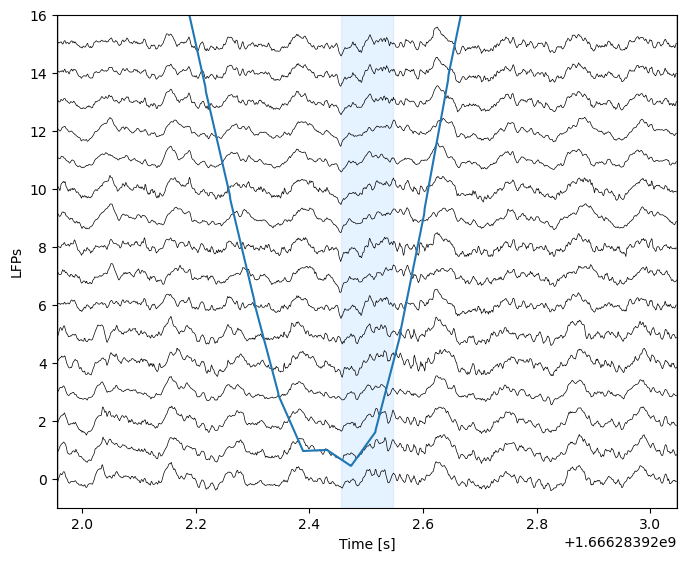

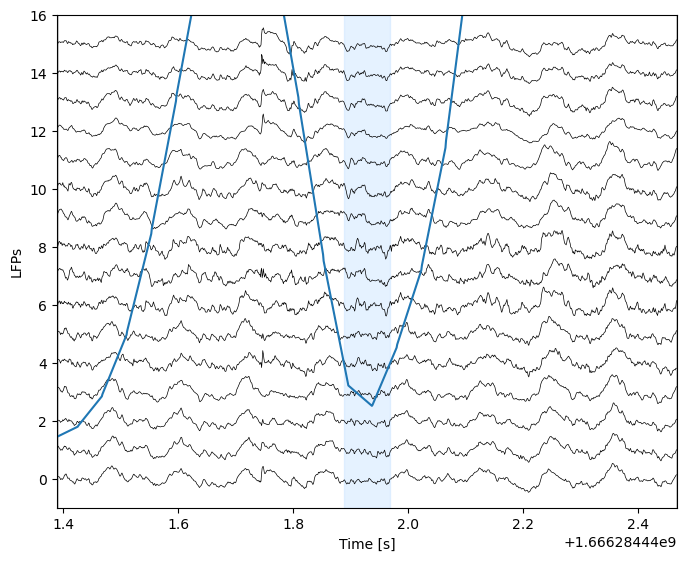

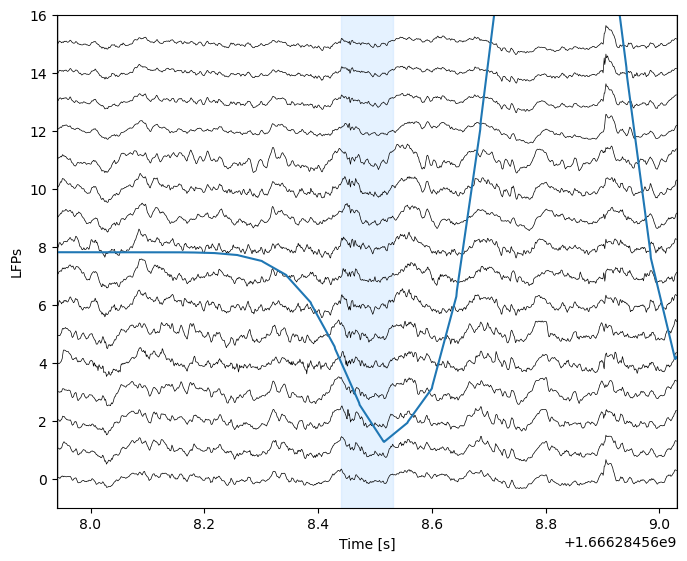

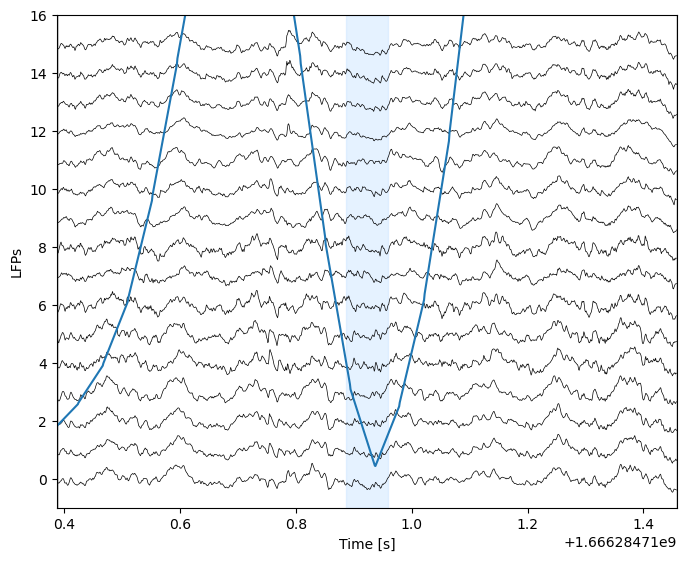

In [395]:
"""Unique ripple events found by Consensus Method"""
for r in np.argwhere(unique_ripple_index).ravel():
    ripple_name = RippleTimes_processed[animal].iloc[r].name
    plot_ripple(lfp_df, RippleTimes_processed[animal],
                ripple_label=ripple_name,  offset=0.5, relative=False)

    # Add speed into on top
    offset = 0.5
    op = RippleTimes_processed[animal].loc[ripple_name].start_time - offset
    ed = RippleTimes_processed[animal].loc[ripple_name].end_time + offset
    ind = np.logical_and(position_info[animal].index >= op, position_info[animal].index <= ed)
    
    plt.plot(position_info[animal].head_speed[ind])

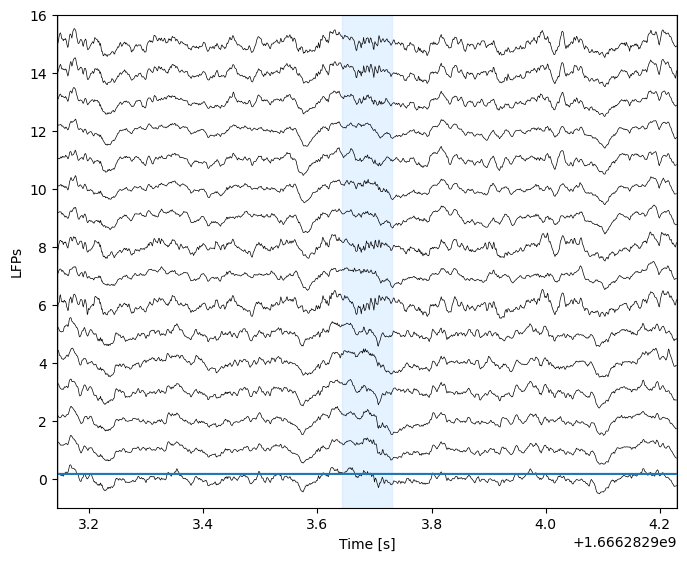

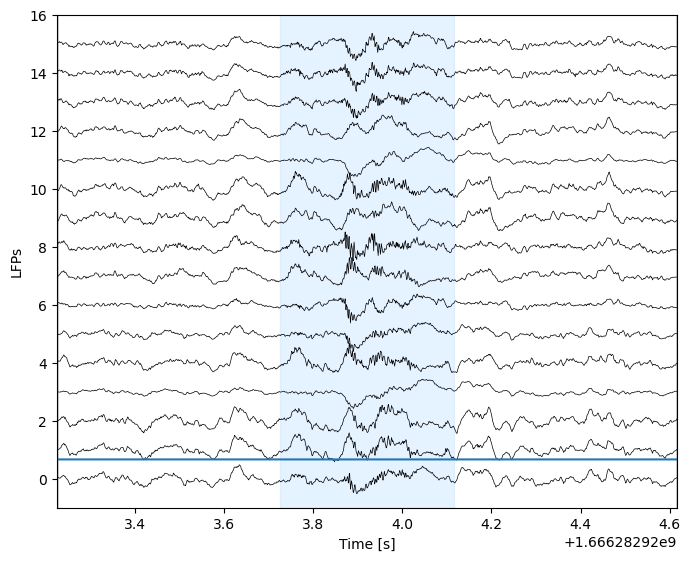

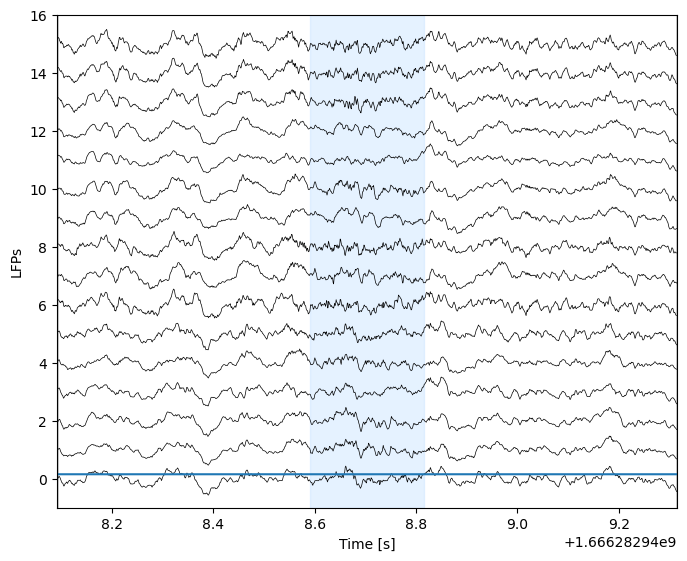

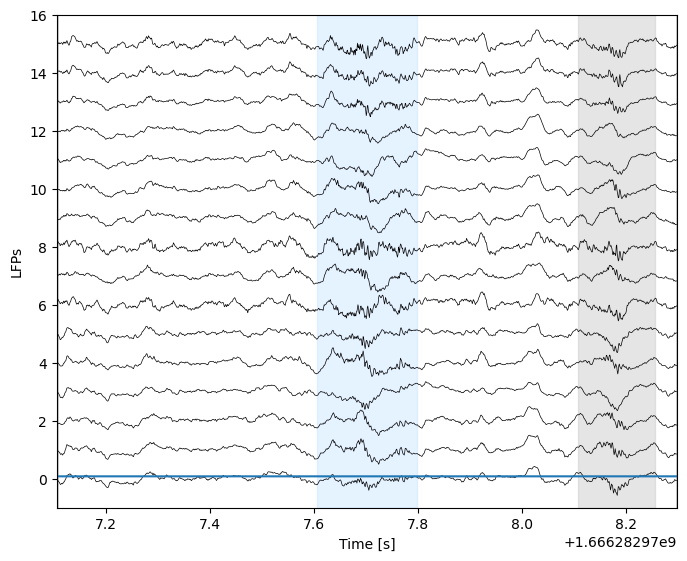

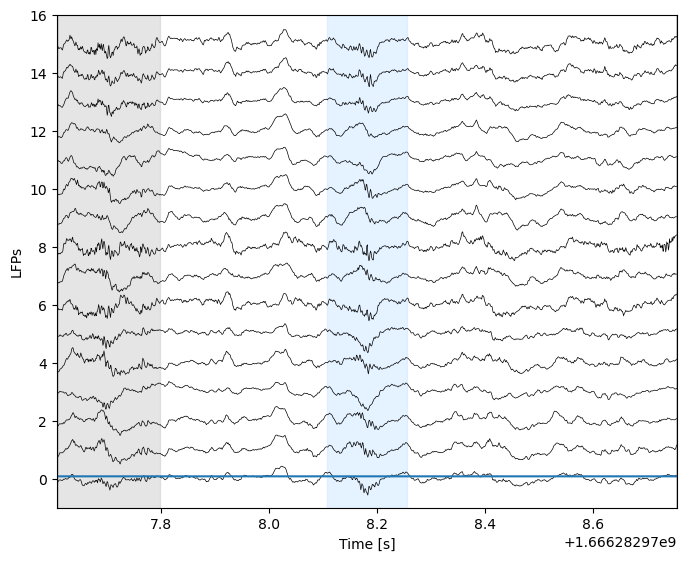

...

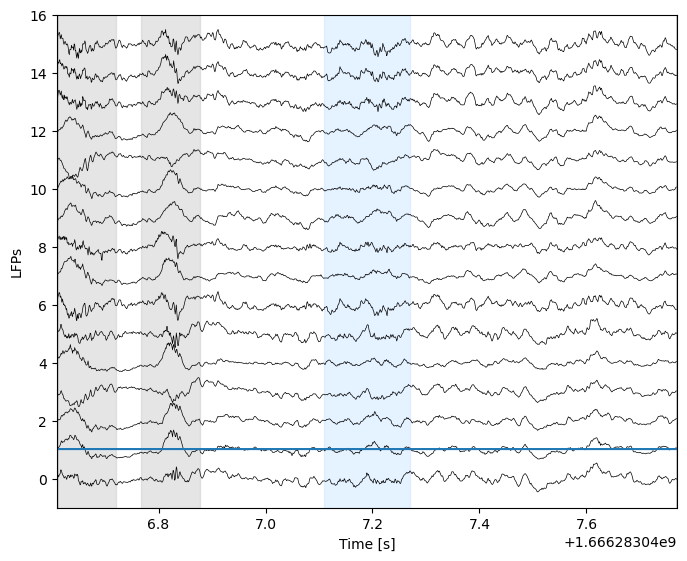

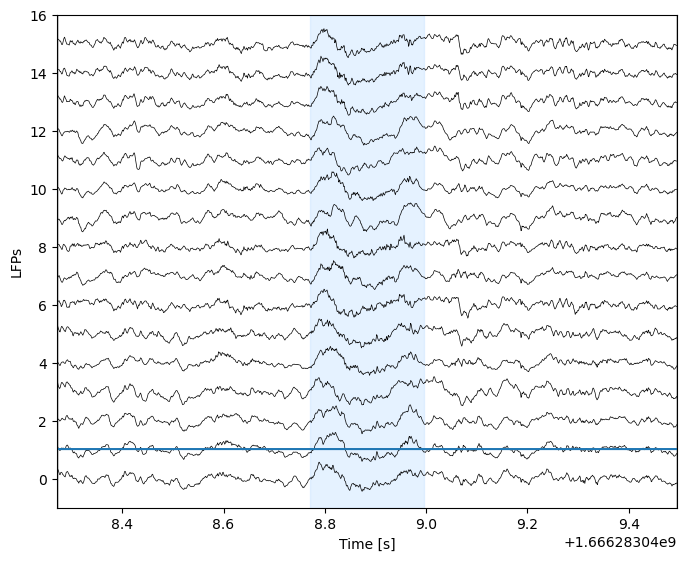

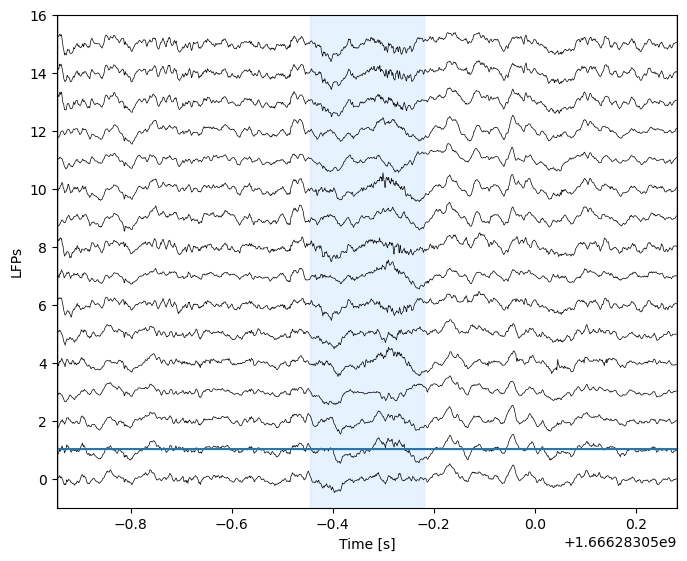

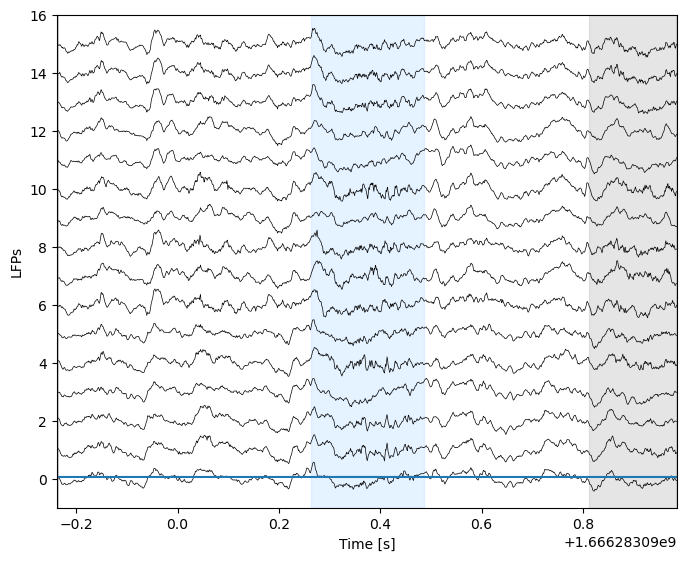

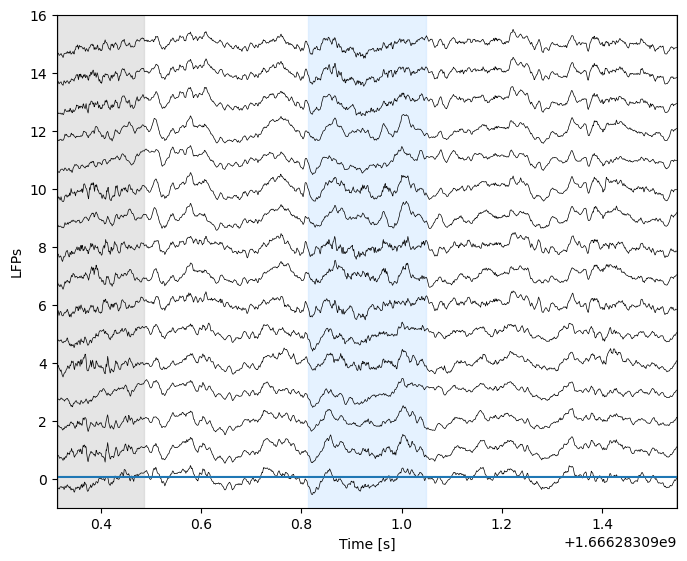

In [396]:
"""Common ripple events found by both methods"""

for r in RippleTimes_InterSection[animal].index[20:40]:
    ripple_name = r
    plot_ripple(lfp_df, RippleTimes_InterSection[animal],
                ripple_label=ripple_name,  offset=0.5, relative=False)

    # Add speed into on top
    offset = 0.5
    op = RippleTimes_InterSection[animal].loc[ripple_name].start_time - offset
    ed = RippleTimes_InterSection[animal].loc[ripple_name].end_time + offset
    ind = np.logical_and(position_info[animal].index >= op, position_info[animal].index <= ed)
    
    plt.plot(position_info[animal].head_speed[ind])

#### The next cell allows you to just look at one.

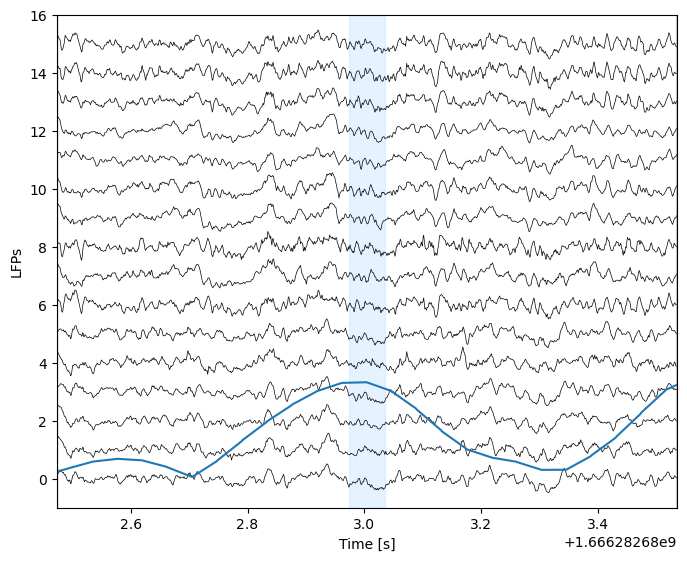

In [318]:
ripple_id = 3

ripple_name = np.argwhere(unique_ripple_index_K).ravel()[ripple_id]


plot_ripple(lfp_df, RippleTimes_Karlsson_processed[animal],
            ripple_label=ripple_name,  offset=0.5, relative=False)

offset = 0.2
op = RippleTimes_Karlsson_processed[animal].loc[ripple_name].start_time - offset
ed = RippleTimes_Karlsson_processed[animal].loc[ripple_name].end_time + offset

# Get speed
ind = np.logical_and(position_info[animal].index >= op, position_info[animal].index <= ed)

plt.plot(position_info[animal].head_speed[ind])
#plt.ylim((0, 10))

## Conclusions
1. Unique events can still find non SWR events. These tend to be before animal start moving or after stop moving. Lowering SD to below 2 will be dangerous.
2. Events found by intersection look good.
### We will use common events found by both events, with the union of timestamps for each event.